## 程序  
1.讀取圖片  
2.色彩空間轉換  
3.細胞質分割  
4.細胞核分割  
5.分水嶺  

In [33]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from skimage import measure

### 1.讀取讀片

<ipython-input-44-a24d6fdb2877>:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,10))


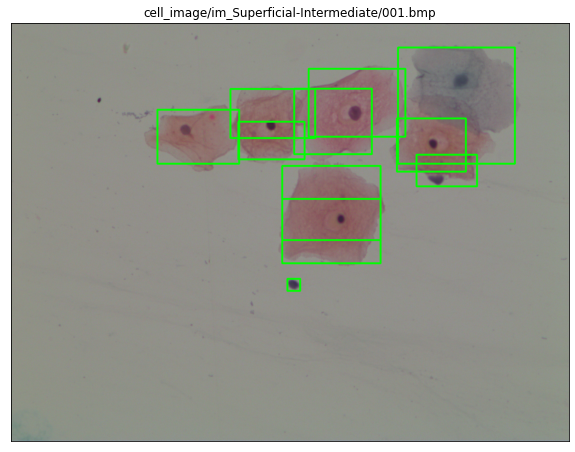

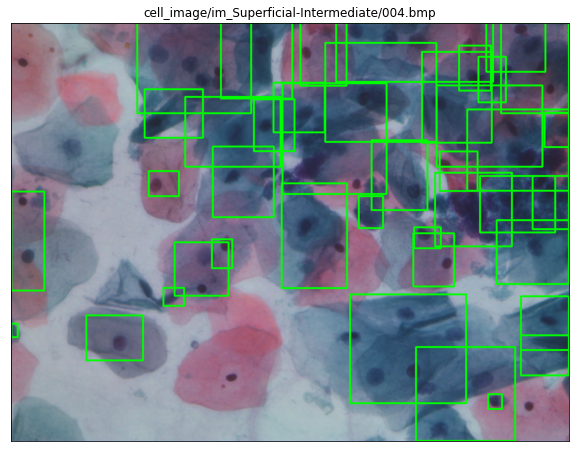

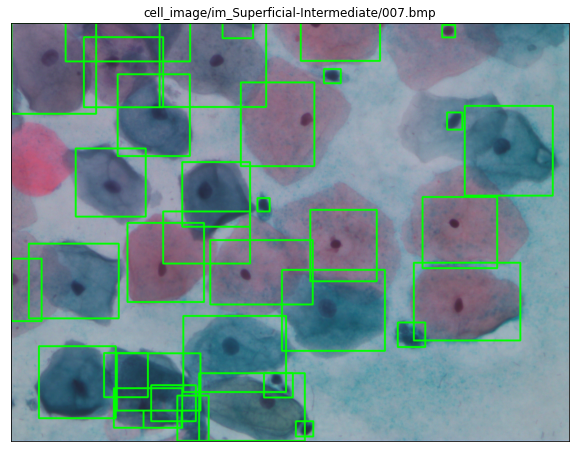

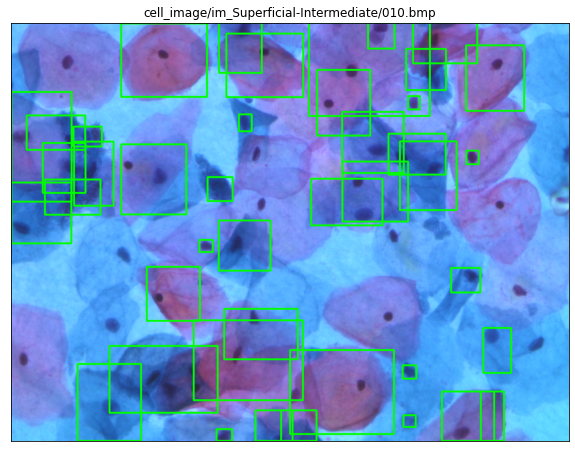

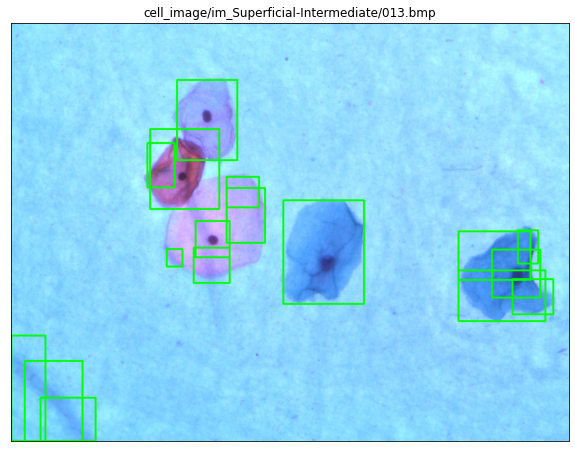

...

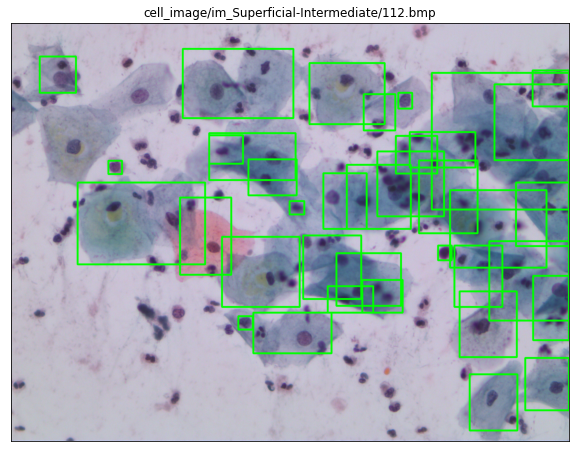

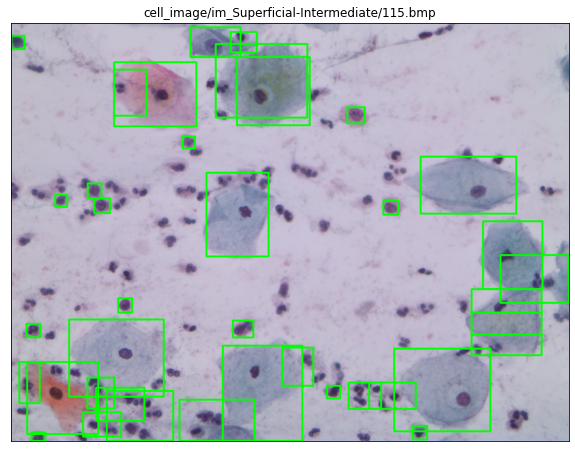

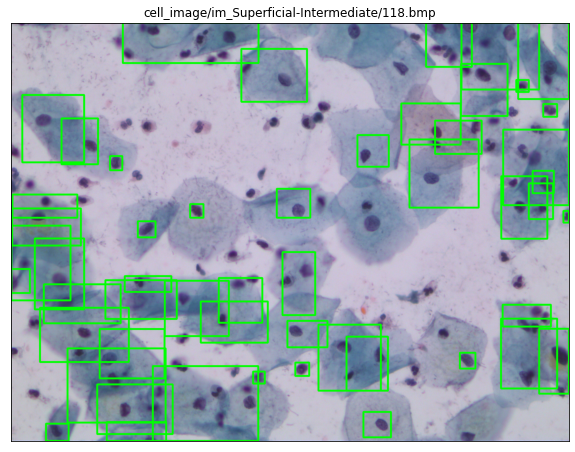

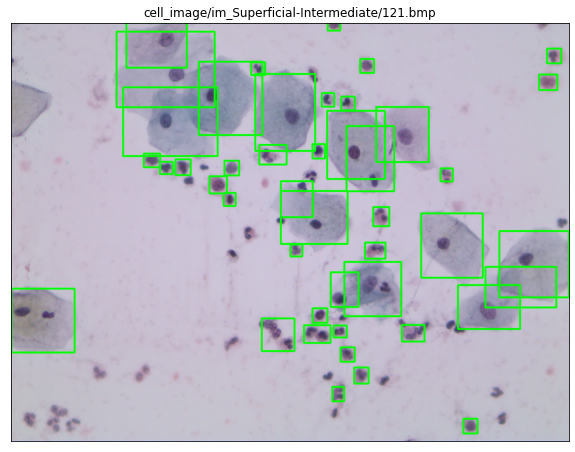

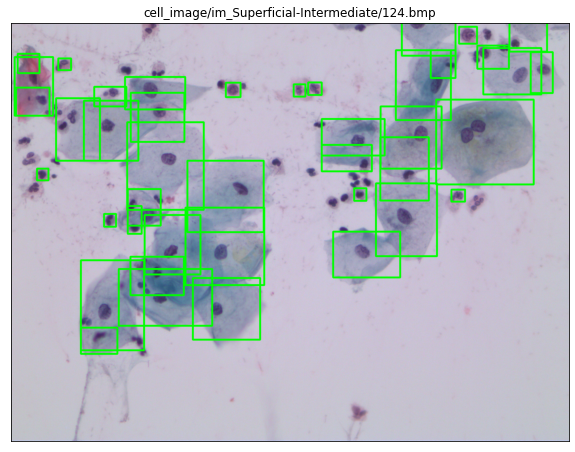

In [44]:
#image_folder_path = 'cell_image/im_Dyskeratotic'
#image_folder_path = 'cell_image/im_Koilocytotic'
#image_folder_path = 'cell_image/im_Metaplastic'
#image_folder_path = 'cell_image/im_Parabasal'
image_folder_path = 'cell_image/im_Superficial-Intermediate'




img_file_name_list = []

for filename in os.listdir(image_folder_path):
    img_file_name_list.append(filename)

for j in range(0,len(img_file_name_list),3):
    
    #img = cv2.imread(image_folder_path+'/'+img_file_name_list[25])
    img = cv2.imread(image_folder_path+'/'+img_file_name_list[j])


    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    #https://stackoverflow.com/questions/19181485/splitting-image-using-opencv-in-python
    img_g = img_rgb[:,:,1]

    #中值慮波
    img_rgb_median = cv2.medianBlur(img_rgb,23)
    gray_median = cv2.cvtColor(img_rgb_median, cv2.COLOR_RGB2GRAY)

    #增強對比
    clahe_1 = cv2.createCLAHE(clipLimit= 5.0,tileGridSize=(1,1))
    cl_1 = clahe_1.apply(gray_median)

    #otsu閥值分割
    ret, th_1 = cv2.threshold(cl_1, 0, 255 ,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) 

    #型態學處理
    kernel_1 = np.ones((15,15),np.uint8)
    opening_1 = cv2.morphologyEx(th_1, cv2.MORPH_OPEN, kernel_1, iterations = 6) 

    #mask原始抹片 
    roi_1 = cv2.bitwise_and(img_rgb,img_rgb,mask = opening_1) 

    #高斯濾波
    blur_1 = cv2.GaussianBlur(img_g,(7,7),0)

    #增強對比
    clahe_2 = cv2.createCLAHE(clipLimit= 3.0,tileGridSize=(15,15))
    cl_2 = clahe_2.apply(blur_1)

    #找出最黑的10%閥值
    #https://github.com/manuelaguadomtz/pythreshold/blob/master/pythreshold/global_th/p_tile.py
    def p_tile_threshold(image, pct):
        """Runs the p-tile threshold algorithm.
        Reference:
        Parker, J. R. (2010). Algorithms for image processing and
        computer vision. John Wiley & Sons.
        @param image: The input image
        @type image: ndarray
        @param pct: The percent of desired background pixels (black pixels).
            It must lie in the interval [0, 1]
        @type pct: float
        @return: The p-tile global threshold
        @rtype int
        """
        n_pixels = pct * image.shape[0] * image.shape[1]
        hist = np.histogram(image, bins=range(256))[0]
        hist = np.cumsum(hist)

        return np.argmin(np.abs(hist - n_pixels))

    threshold=p_tile_threshold(cl_2,0.05)

    #閥值分割
    ret, th_2 = cv2.threshold(cl_2,threshold,255,cv2.THRESH_BINARY_INV) 
    
    #型態學處理
    kernel_2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(30,30))
    kernel_3 = np.ones((5,5),np.uint8)

    opening_2 = cv2.morphologyEx(th_2, cv2.MORPH_OPEN, kernel_2) 

    dilation_1 = cv2.dilate(opening_2,kernel_3,iterations = 3) 

    #mask原始抹片
    #roi = cv2.bitwise_and(img_rgb,img_rgb,mask = opening) 
    roi_2 = cv2.bitwise_and(img_rgb,img_rgb,mask = dilation_1) 

    #unknown

    sure_bg = opening_1
    sure_fg = dilation_1
    unknown = cv2.subtract(sure_bg, sure_fg)

    # 类别标记
    ret3, markers = cv2.connectedComponents(sure_fg)

    # 为所有的标记加20
    markers = markers+20

    # 现在让所有的未知区域为0
    markers[unknown==255] = 0

    markers = cv2.watershed(roi_1, markers)

    props = measure.regionprops(markers)

    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)


    for i in range(1,len(props)):

        minr, minc, maxr, maxc = props[i].bbox
        cv2.rectangle(img_rgb,(minc,minr),(maxc,maxr),(0,255,0),5)

    fig = plt.figure(figsize=(10,10))
    plt.title(image_folder_path+'/'+img_file_name_list[j])
    ax = plt.gca()
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    plt.imshow(img_rgb)